# This is a presentation

In [2]:
#library(tidyverse)
library(MOFA2)
library(ggplot2)
library(cowplot)
library(data.table)
library(purrr)
library(reticulate)
library(Seurat)
library(Signac)
library(MOFA2)
library(ggpubr)
library(msigdbr)
library(ggbio)
library(magrittr)
library(psych)

In [3]:
sortedMOFA   <- MOFA2::load_model("../data/10k_sorted_3__trained_mofa.rds")
unsortedMOFA   <- MOFA2::load_model("../data/10k_unsorted_3__trained_mofa.rds")
sortedSeurat <- readRDS("../data/10k_sorted_3__seurat.rds")
unsortedSeurat <- readRDS("../data/10k_unsorted_3__seurat.rds")

Warning message in quality_control(object, verbose = verbose):
"Factor(s) 1, 2 are strongly correlated with the total number of expressed features for at least one of your omics. Such factors appear when there are differences in the total 'levels' between your samples, *sometimes* because of poor normalisation in the preprocessing steps.
"
Warning message in quality_control(object, verbose = verbose):
"Factor(s) 1, 5 are strongly correlated with the total number of expressed features for at least one of your omics. Such factors appear when there are differences in the total 'levels' between your samples, *sometimes* because of poor normalisation in the preprocessing steps.
"


In [4]:
head(sortedSeurat@meta.data[,c("celltype", "broad_celltype","pass_rnaQC","pass_accQC")])
head(unsortedSeurat@meta.data[,c("celltype", "broad_celltype","pass_rnaQC","pass_accQC")])

,celltype,broad_celltype,pass_rnaQC,pass_accQC
,<chr>,<chr>,<lgl>,<lgl>
AAACAGCCAAGGAATC-1,CD4 Naive,Lymphoid,TRUE,TRUE
AAACAGCCAATCCCTT-1,CD4 Memory,Lymphoid,TRUE,TRUE
AAACAGCCAATGCGCT-1,CD4 Naive,Lymphoid,TRUE,TRUE
AAACAGCCACACTAAT-1,CD8 Naive,Lymphoid,TRUE,TRUE
AAACAGCCACCAACCG-1,CD8 Naive,Lymphoid,TRUE,TRUE
AAACAGCCAGGATAAC-1,CD4 Naive,Lymphoid,TRUE,TRUE


,celltype,broad_celltype,pass_rnaQC,pass_accQC
,<chr>,<chr>,<lgl>,<lgl>
AAACAGCCAAAGCCTC-1,CD8 Naive,Lymphoid,TRUE,TRUE
AAACAGCCAGAATGAC-1,CD14+ Monocytes,CD14+ Monocytes,TRUE,TRUE
AAACAGCCAGCTACGT-1,CD14+ Monocytes,CD14+ Monocytes,TRUE,TRUE
AAACAGCCAGGCCTTG-1,CD14+ Monocytes,CD14+ Monocytes,TRUE,TRUE
AAACAGCCATAAGGAC-1,CD4 Naive,Lymphoid,TRUE,TRUE
AAACAGCCATAATGTC-1,CD4 Naive,Lymphoid,TRUE,TRUE


In [4]:
table(sortedSeurat@meta.data$celltype)
table(sortedSeurat@meta.data$broad_celltype)
table(unsortedSeurat@meta.data$celltype)
table(unsortedSeurat@meta.data$broad_celltype)


     B cell progenitor        CD14+ Monocytes        CD16+ Monocytes 
                   522                   3369                    461 
            CD4 Memory              CD4 Naive           CD8 effector 
                  2227                   1952                    755 
             CD8 Naive         Dendritic cell Double negative T cell 
                  1297                    133                    147 
               NK cell                    pDC              Platelets 
                   477                    114                      2 
            pre-B cell 
                   453 


CD14+ Monocytes CD16+ Monocytes        Lymphoid       Platelets 
           3369             461            8077               2 


     B cell progenitor        CD14+ Monocytes        CD16+ Monocytes 
                   636                   4032                    506 
            CD4 Memory              CD4 Naive           CD8 effector 
                  1999                   1549                    747 
             CD8 Naive         Dendritic cell Double negative T cell 
                  1069                    131                    138 
               NK cell                    pDC              Platelets 
                   458                    126                      5 
            pre-B cell 
                   620 


CD14+ Monocytes CD16+ Monocytes        Lymphoid       Platelets 
           4032             506            7473               5 

In [5]:
samples_metadata(sortedMOFA) <- sortedSeurat@meta.data %>%
  tibble::rownames_to_column("sample") %>%
  as.data.table
samples_metadata(unsortedMOFA) <- unsortedSeurat@meta.data %>%
  tibble::rownames_to_column("sample") %>%
  as.data.table

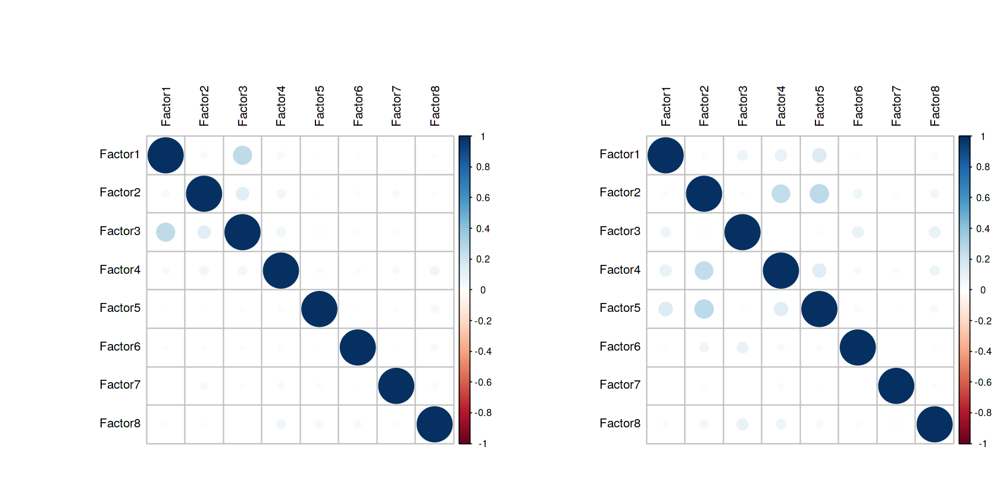

In [6]:
options(repr.plot.width = 14, repr.plot.height = 7)

par(mfrow = c(1,2))
MOFA2::plot_factor_cor(sortedMOFA)
MOFA2::plot_factor_cor(unsortedMOFA)

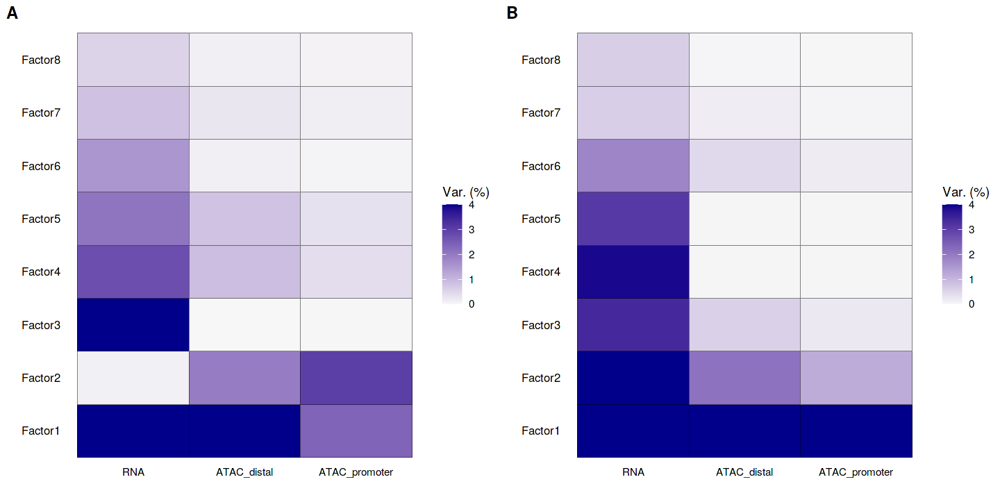

In [7]:
options(repr.plot.width = 12, repr.plot.height = 6)

a <- MOFA2::plot_variance_explained(sortedMOFA, max_r2 = 4)
b <- MOFA2::plot_variance_explained(unsortedMOFA, max_r2 = 4)
cowplot::plot_grid(a, b, labels = "AUTO", align = "h")

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



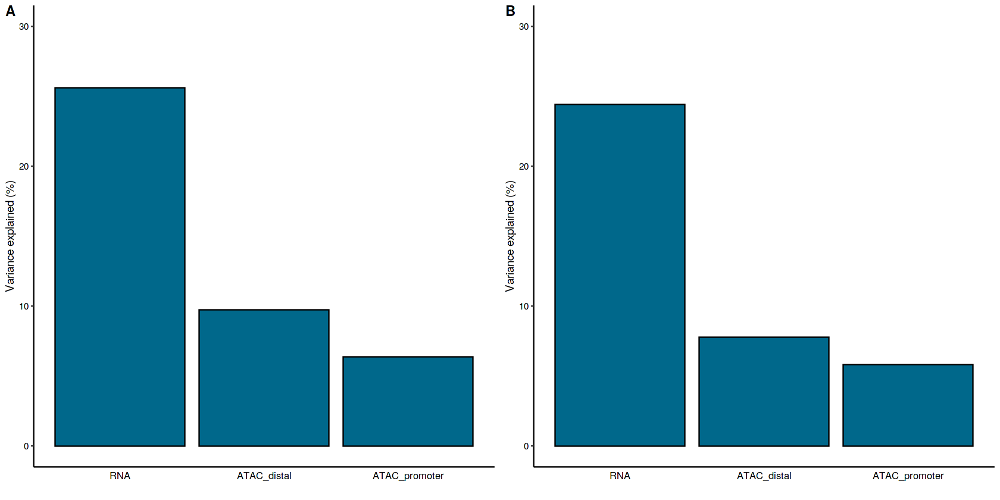

In [8]:
options(repr.plot.width = 14, repr.plot.height = 7)


a <- MOFA2::plot_variance_explained(sortedMOFA,
                             plot_total = TRUE)[[2]] +
     ylim(0, 30)

b <- MOFA2::plot_variance_explained(unsortedMOFA,
                             plot_total = TRUE)[[2]] +
     ylim(0, 30)
cowplot::plot_grid(a, b, labels = "AUTO", align = "h")

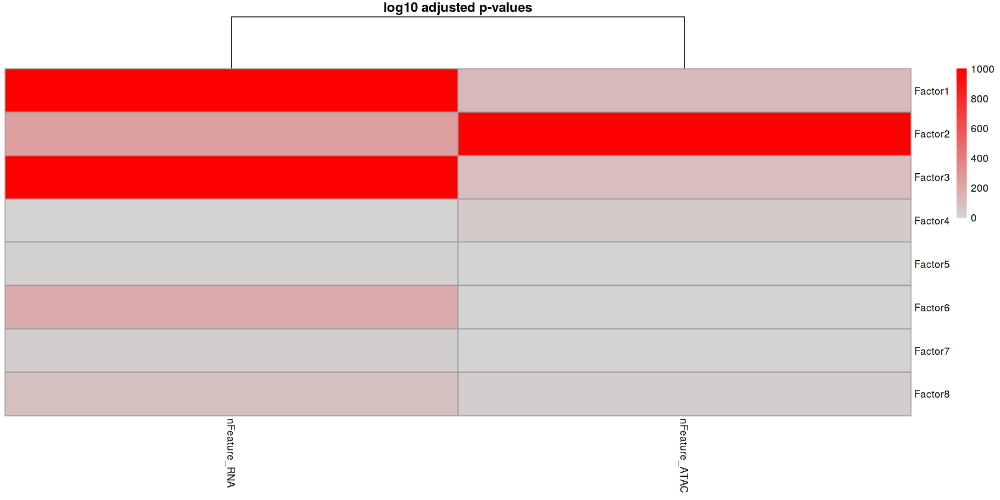

In [9]:
MOFA2::correlate_factors_with_covariates(sortedMOFA, 
  covariates = c("nFeature_RNA","nFeature_ATAC")
  )

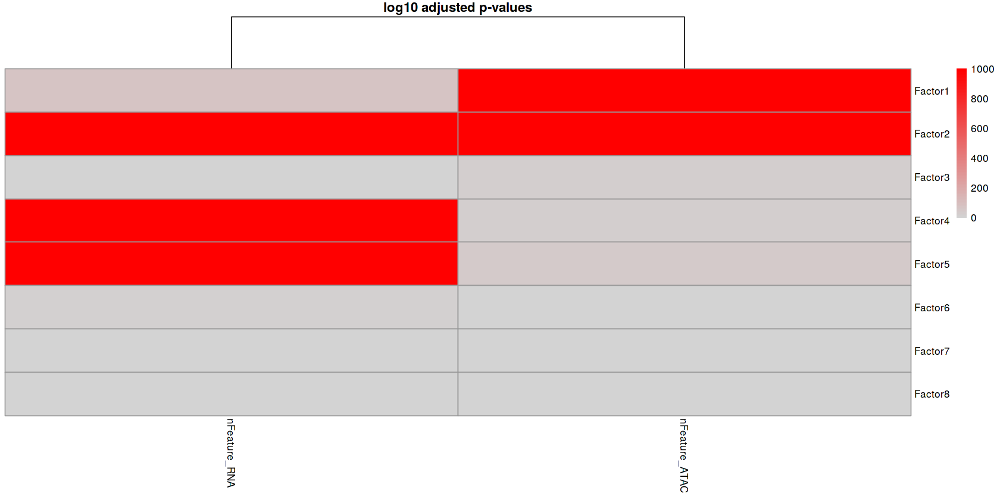

In [10]:
MOFA2::correlate_factors_with_covariates(unsortedMOFA,
  covariates = c("nFeature_RNA","nFeature_ATAC")
  )

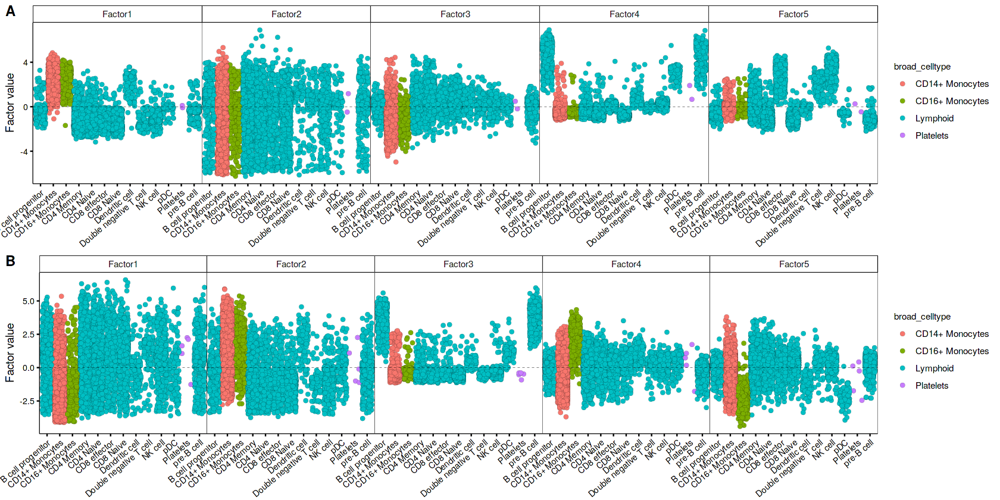

In [11]:
options(repr.plot.width = 14, repr.plot.height = 7)

a <- MOFA2::plot_factor(sortedMOFA, factors=c(1,2, 3, 4, 5), group_by = "celltype", color_by = "broad_celltype") +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
b <- MOFA2::plot_factor(unsortedMOFA, factors=c(1,2, 3, 4, 5), group_by = "celltype", color_by = "broad_celltype") +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

# factor 4 of sorted and 3 of unstored seem to select for the same cell types
# factor 1 of sorted and 4 of unstored might do as well.
# factor 3 of sorted and 5 of unstored might do as well.

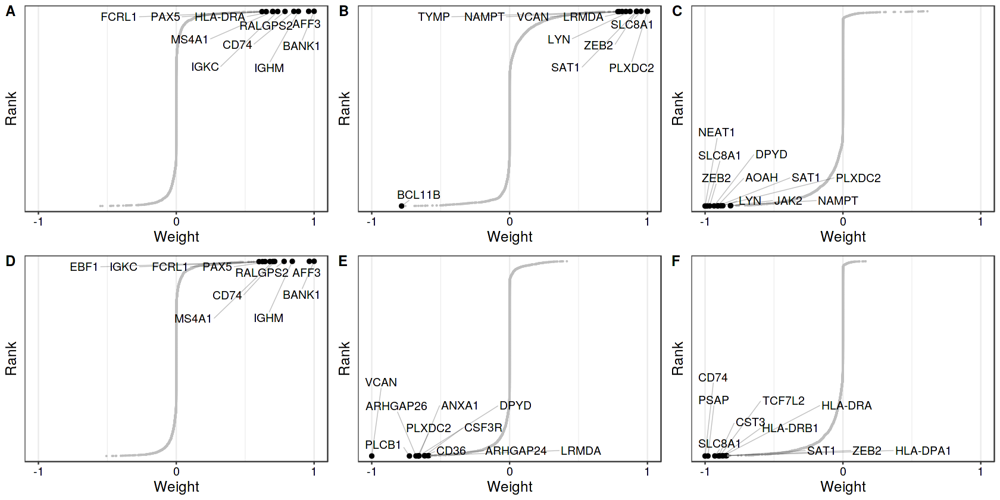

In [12]:
a <- plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
)
d <- plot_weights(unsortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
)
b <- plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 1, 
  nfeatures = 10, 
  text_size = 4
)
e <- plot_weights(unsortedMOFA, 
  view = "RNA", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
)
c <- plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
)
f <- plot_weights(unsortedMOFA, 
  view = "RNA", 
  factors = 5, 
  nfeatures = 10, 
  text_size = 4
)
cowplot::plot_grid(a, b, c, d ,e, f, labels = "AUTO", nrow = 2)

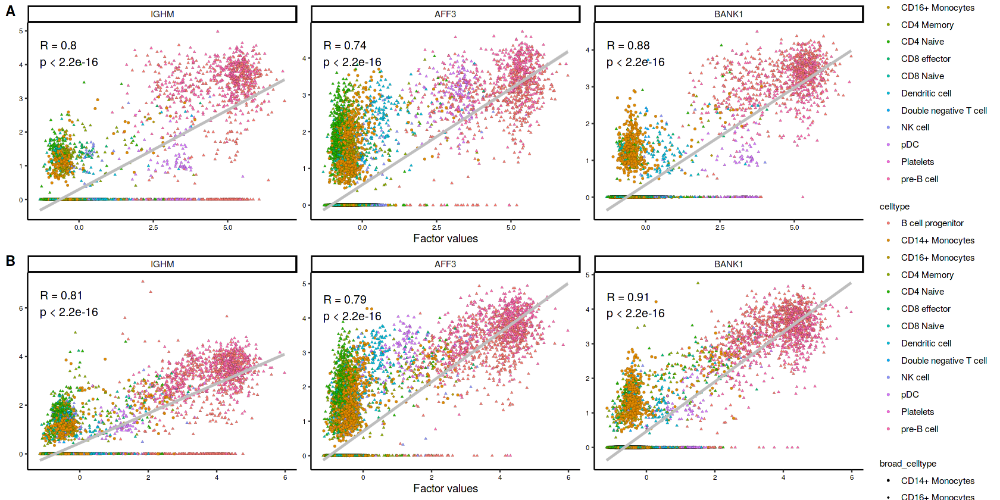

In [13]:
# factor 4 of sorted and 3 of unstored seem to selecto for the sam cell
a <- plot_data_scatter(sortedMOFA, 
  view = "RNA", 
  factor = 4, 
  features = 3,
  color_by = "celltype",
  shape_by = "broad_celltype",
  add_lm = T,
  dot_size = 1
)
b <- plot_data_scatter(unsortedMOFA, 
  view = "RNA", 
  factor = 3, 
  features = 3,
  color_by = "celltype",
  shape_by = "broad_celltype",
  add_lm = T,
  dot_size = 1
)
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

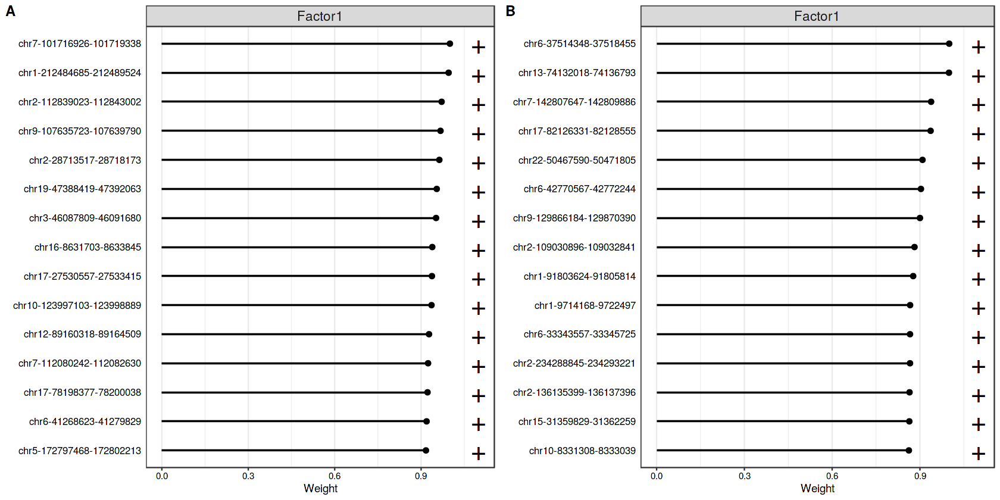

In [14]:
# less usefull?
a <- plot_top_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 1, 
  sign = "positive",
  nfeatures = 15,
)
b <- plot_top_weights(unsortedMOFA, 
  view = "ATAC_distal", 
  factors = 1, 
  sign = "positive",
  nfeatures = 15,
)
cowplot::plot_grid(a, b, labels = "AUTO", nrow = 1)

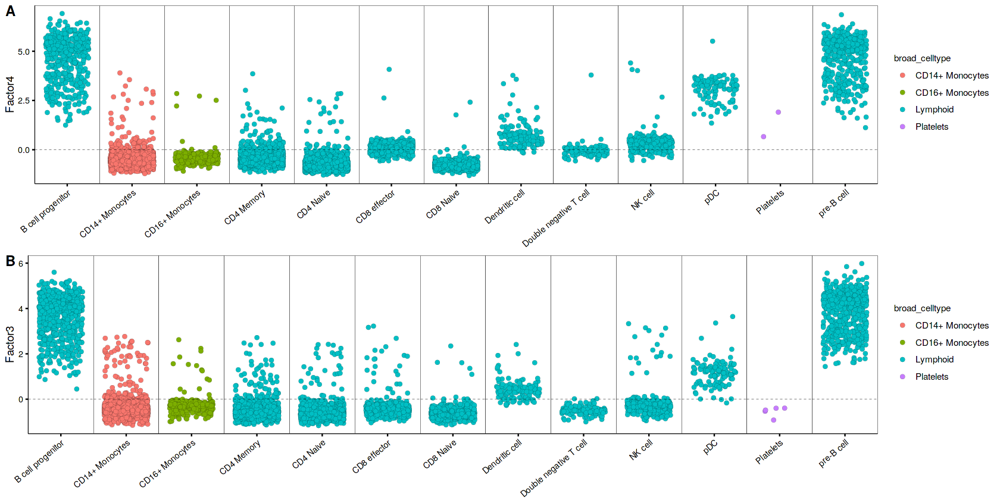

In [15]:
a <- plot_factor(sortedMOFA, factors=4, group_by = "celltype", color_by = "broad_celltype") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(unsortedMOFA, factors=3, group_by = "celltype", color_by = "broad_celltype") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )

cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

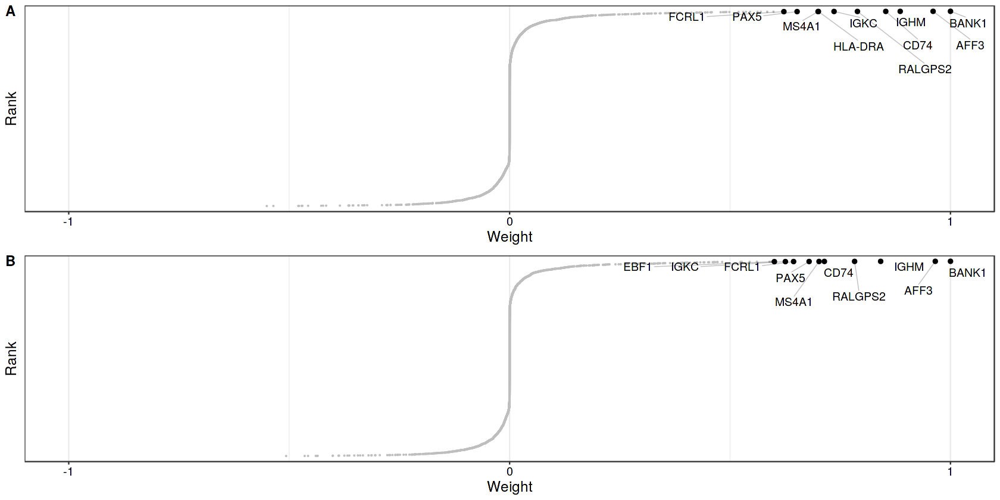

In [16]:
a <- plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
)
b <- plot_weights(unsortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
)
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

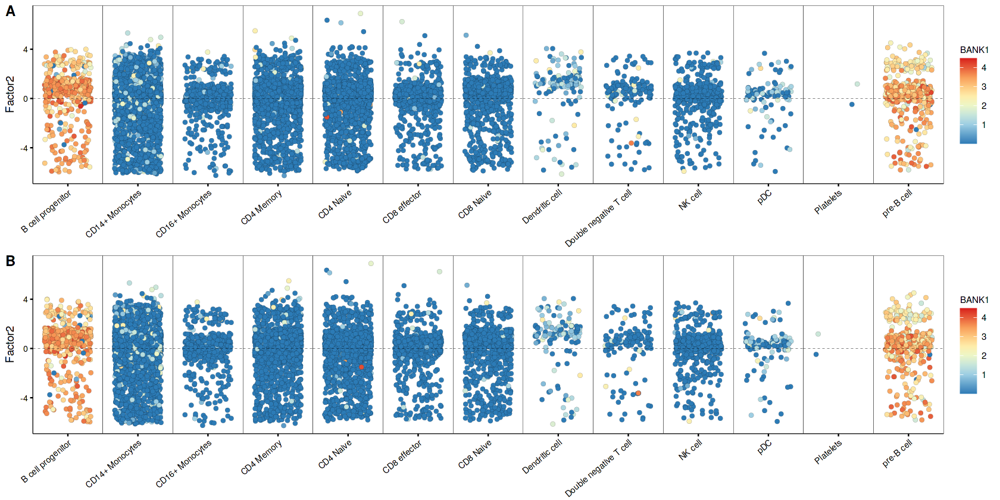

In [17]:
a <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="BANK1") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="BANK1") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

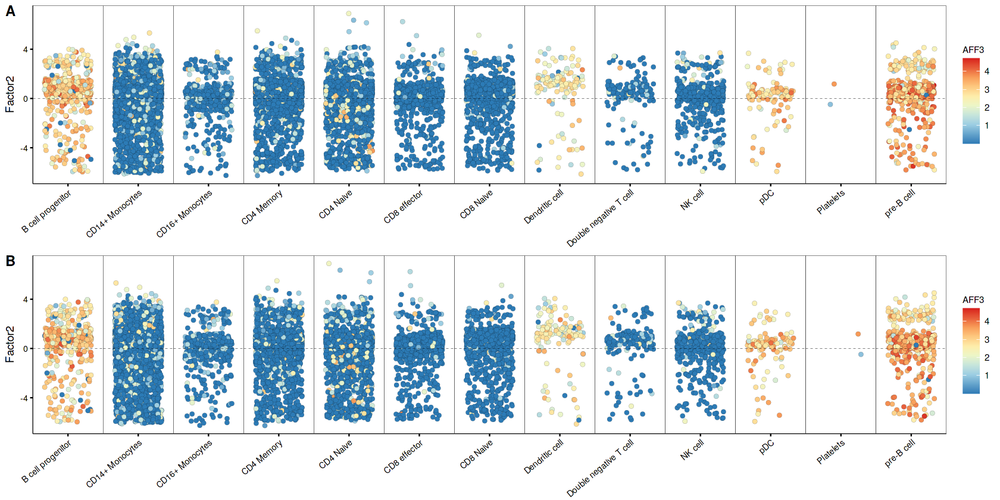

In [18]:
a <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="AFF3") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="AFF3") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

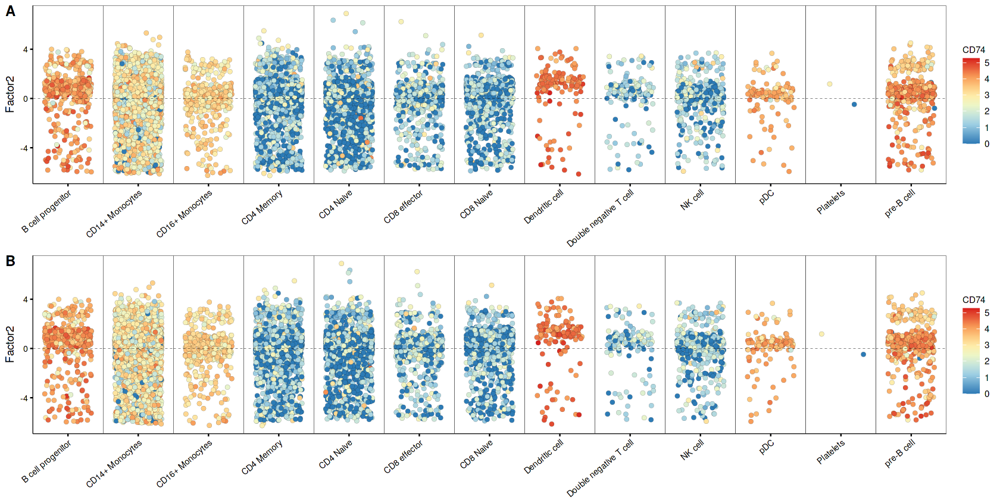

In [19]:
a <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="CD74") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="CD74") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

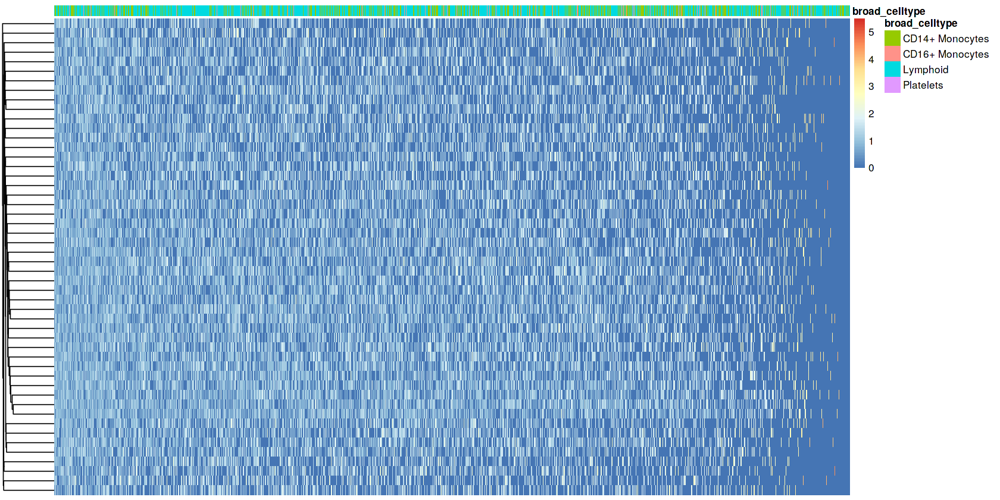

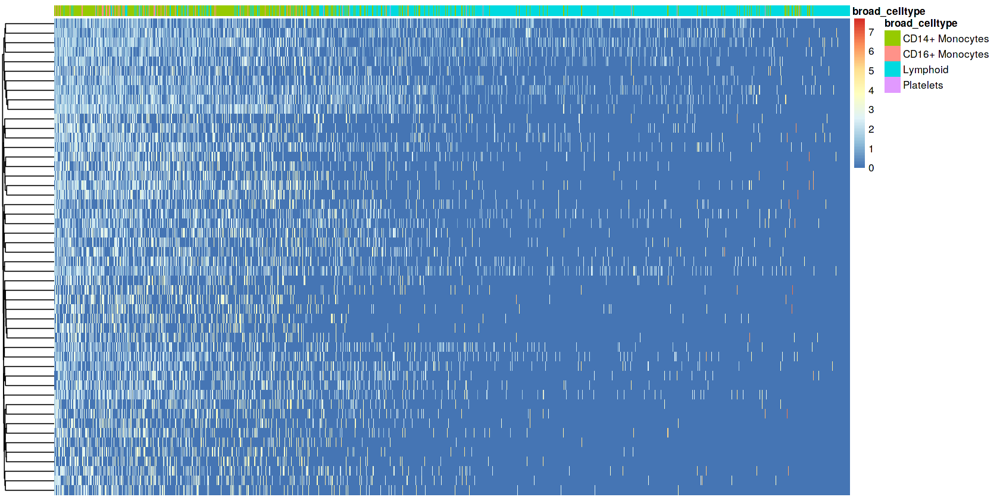

In [20]:
plot_data_heatmap(sortedMOFA, 
  view = "ATAC_promoter", 
  factor = 2, 
  features = 50,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype"
)
plot_data_heatmap(unsortedMOFA, 
  view = "ATAC_promoter", 
  factor = 2, 
  features = 50,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype"
)

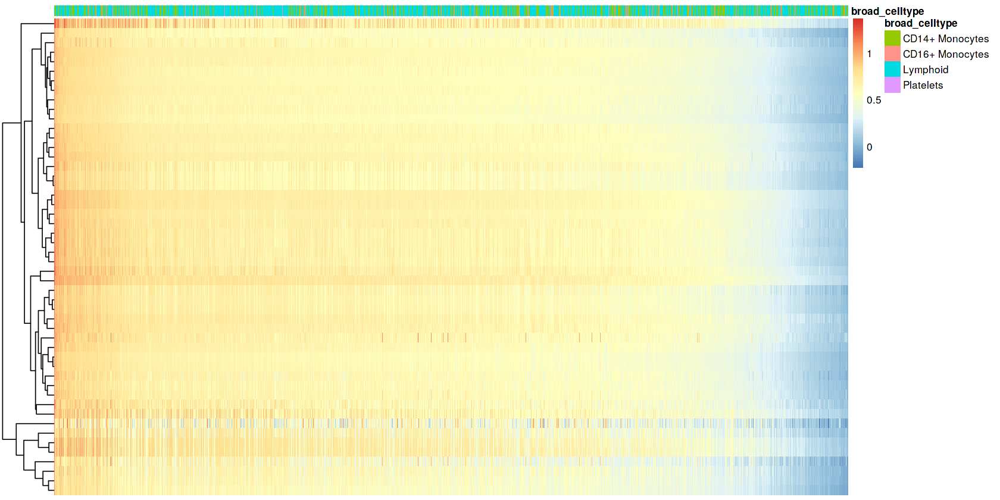

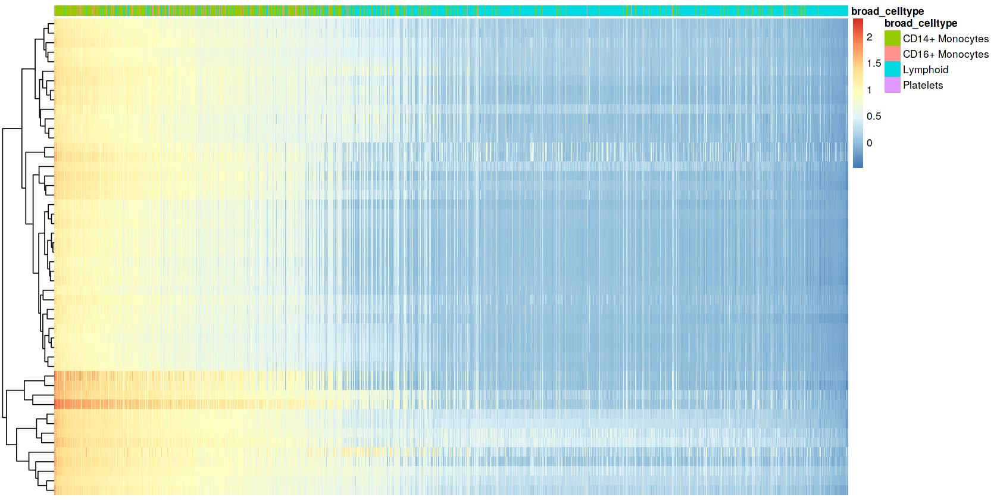

In [21]:
plot_data_heatmap(sortedMOFA, 
  view = "ATAC_promoter", 
  factor = 2, 
  features = 50,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype",
  denoise = TRUE
)
plot_data_heatmap(unsortedMOFA, 
  view = "ATAC_promoter", 
  factor = 2, 
  features = 50,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype",
  denoise = TRUE
)

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...



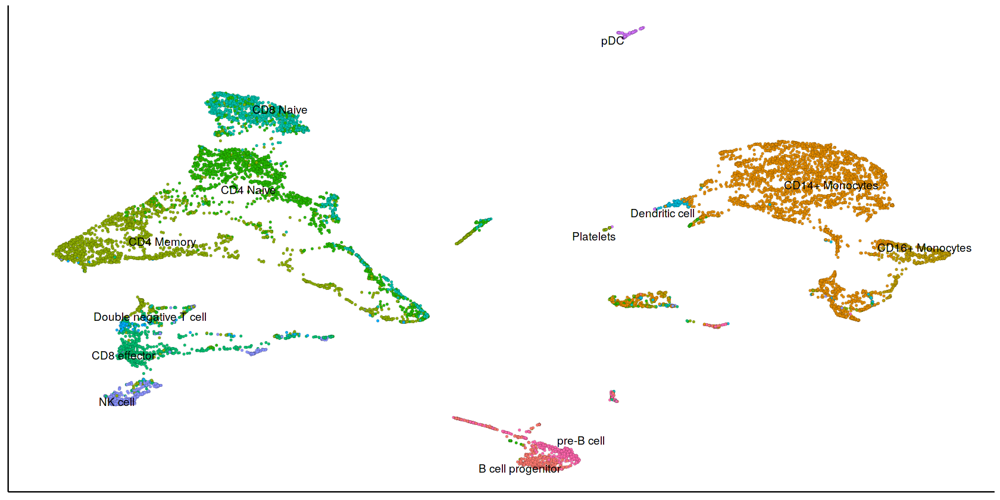

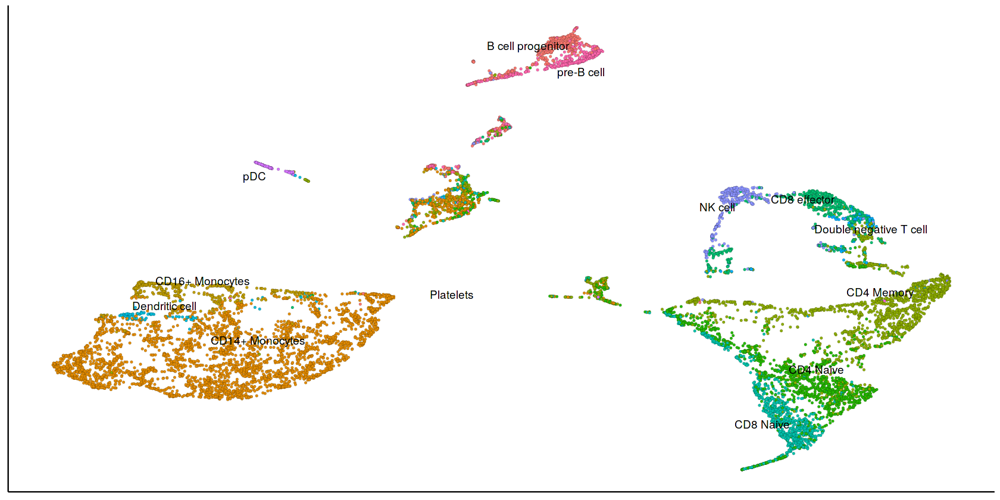

In [22]:
factors <- 1:get_dimensions(sortedMOFA)[["K"]]

mofa <- run_umap(sortedMOFA, 
  factors = factors, 
  n_neighbors = 8,  
  min_dist = 0.30
)

plot_dimred(sortedMOFA, 
  method = "UMAP", 
  color_by = "celltype", 
  label = TRUE, 
  stroke=0.05, 
  dot_size = 1, 
  legend = FALSE
)

factors <- 1:get_dimensions(unsortedMOFA)[["K"]]

mofa <- run_umap(unsortedMOFA, 
  factors = factors, 
  n_neighbors = 8,  
  min_dist = 0.30
)

plot_dimred(unsortedMOFA, 
  method = "UMAP", 
  color_by = "celltype", 
  label = TRUE, 
  stroke=0.05, 
  dot_size = 1, 
  legend = FALSE
)

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...



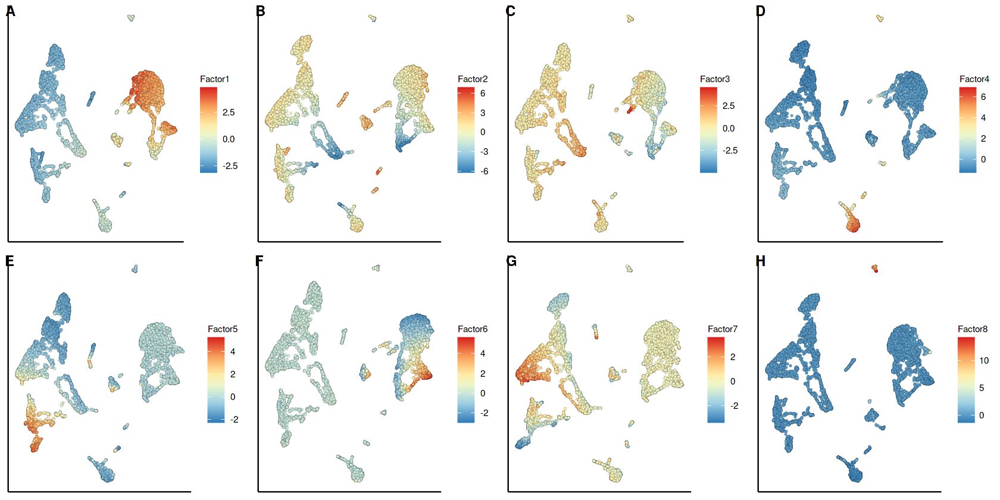

In [26]:
a <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor1", 
stroke = 0.05, 
dot_size = 1
)
b <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor2", 
stroke = 0.05, 
dot_size = 1
)
c <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor3", 
stroke = 0.05, 
dot_size = 1
)
d <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor4", 
stroke = 0.05, 
dot_size = 1
)
e <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor5", 
stroke = 0.05, 
dot_size = 1
)
f <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor6", 
stroke = 0.05, 
dot_size = 1
)
g <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor7", 
stroke = 0.05, 
dot_size = 1
)
h <- plot_dimred(sortedMOFA, 
method = "UMAP", 
color_by = "Factor8", 
stroke = 0.05, 
dot_size = 1
)
cowplot::plot_grid(a, b, c, d, e, f, g, h, labels = "AUTO", nrow = 2)

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...

UMAP embedding was not computed. Running run_umap()...



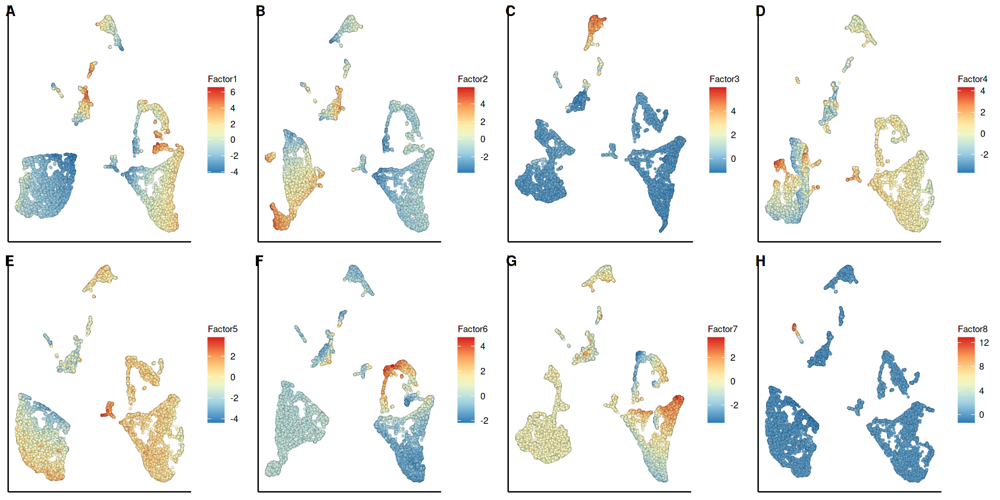

In [27]:
a <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor1", 
stroke = 0.05, 
dot_size = 1
)
b <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor2", 
stroke = 0.05, 
dot_size = 1
)
c <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor3", 
stroke = 0.05, 
dot_size = 1
)
d <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor4", 
stroke = 0.05, 
dot_size = 1
)
e <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor5", 
stroke = 0.05, 
dot_size = 1
)
f <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor6", 
stroke = 0.05, 
dot_size = 1
)
g <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor7", 
stroke = 0.05, 
dot_size = 1
)
h <- plot_dimred(unsortedMOFA, 
method = "UMAP", 
color_by = "Factor8", 
stroke = 0.05, 
dot_size = 1
)
cowplot::plot_grid(a, b, c, d, e, f, g, h, labels = "AUTO", nrow = 2)

In [28]:
sortedSeurat <- SetIdent(sortedSeurat, value="celltype")
Ks <- get_dimensions(sortedMOFA)[["K"]]
unsortedSeurat <- SetIdent(unsortedSeurat, value="celltype")
Ku <- get_dimensions(unsortedMOFA)[["K"]]

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


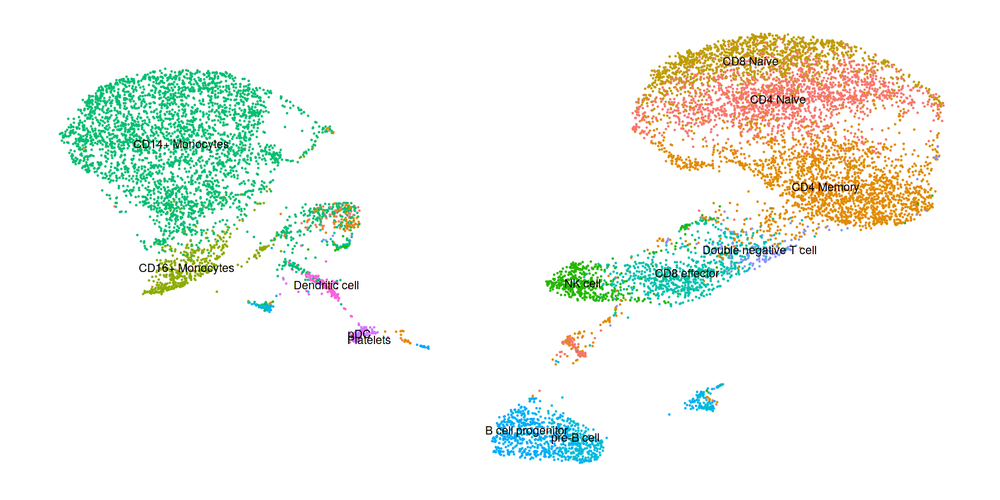

In [29]:
DefaultAssay(sortedSeurat) <- "RNA"
sortedSeurat <- RunPCA(sortedSeurat, npcs = Ks, verbose = FALSE)
sortedSeurat <- RunUMAP(sortedSeurat, reduction = 'pca', dims = 1:Ks, verbose = FALSE)
DimPlot(sortedSeurat, label = TRUE, reduction="umap") + 
  NoLegend() + NoAxes() + scale_fill_manual(values=colors)

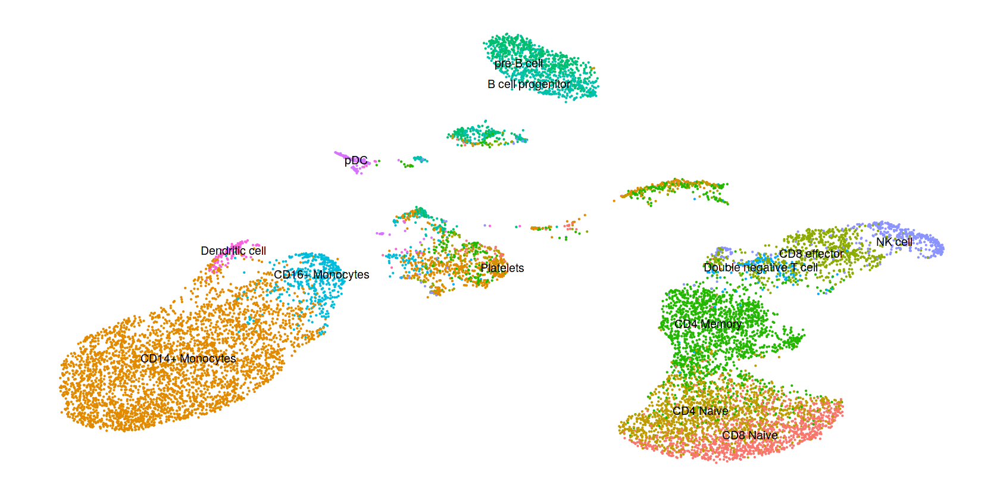

In [30]:
DefaultAssay(unsortedSeurat) <- "RNA"
unsortedSeurat <- RunPCA(unsortedSeurat, npcs = Ku, verbose = FALSE)
unsortedSeurat <- RunUMAP(unsortedSeurat, reduction = 'pca', dims = 1:Ku, verbose = FALSE)
DimPlot(unsortedSeurat, label = TRUE, reduction="umap") + 
  NoLegend() + NoAxes() + scale_fill_manual(values=colors)

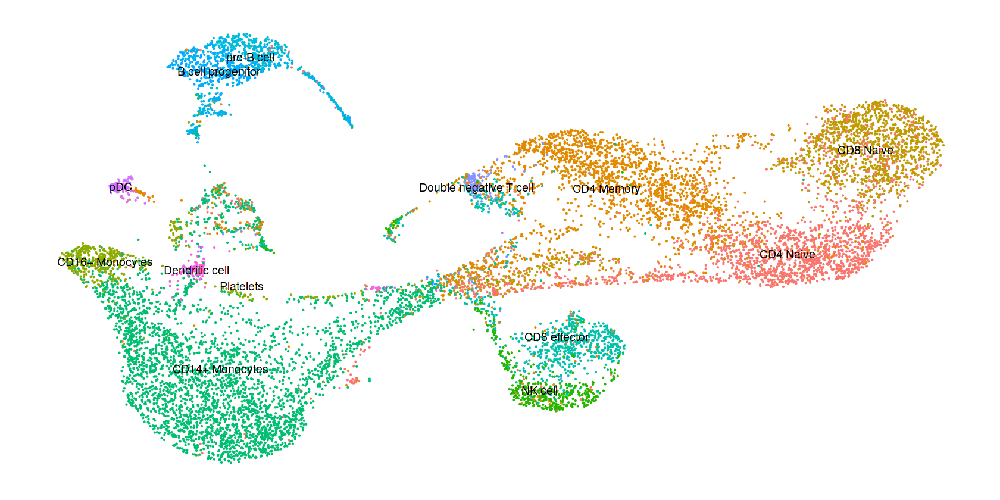

In [31]:
DefaultAssay(sortedSeurat) <- "ATAC_distal"
sortedSeurat <- RunSVD(sortedSeurat, n = Ks, verbose = FALSE)
sortedSeurat <- RunUMAP(sortedSeurat, reduction = 'lsi', dims = 1:Ks, verbose = FALSE)
DimPlot(sortedSeurat, label = TRUE, reduction="umap") + 
  NoLegend() + NoAxes() + scale_fill_manual(values=colors)

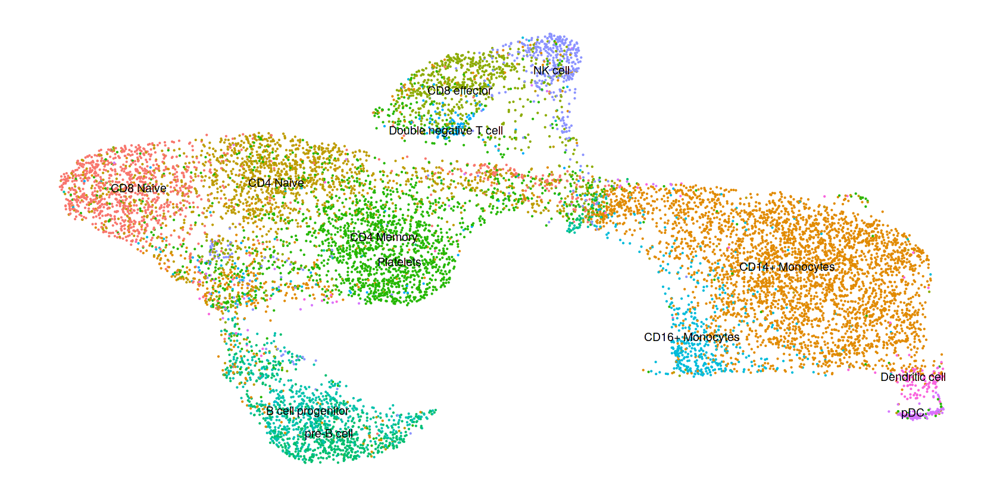

In [32]:
DefaultAssay(unsortedSeurat) <- "ATAC_distal"
unsortedSeurat <- RunSVD(unsortedSeurat, n = Ku, verbose = FALSE)
unsortedSeurat <- RunUMAP(unsortedSeurat, reduction = 'lsi', dims = 1:Ku, verbose = FALSE)
DimPlot(unsortedSeurat, label = TRUE, reduction="umap") + 
  NoLegend() + NoAxes() + scale_fill_manual(values=colors)

In [33]:
msgidb.matrix <- msigdbr(
  species = "Homo sapiens",
  category = "C5", 
  subcategory = "BP"
  ) %>% as.data.table %>% .[,id:=1] %>%
  dcast(gs_name~gene_symbol, value.var="id", fill=0) # %>% 
  # as.matrix()

In [49]:
msgidb.mat <- msgidb.matrix %>% as.data.table %>% .[,id:=1] %>%
  dcast(gs_name~gene_symbol, value.var="id", fill=0)
str(msgidb.mat)

Classes 'data.table' and 'data.frame':	7573 obs. of  17902 variables:
 $ gs_name         : chr  "GO_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS" "GO_2FE_2S_CLUSTER_ASSEMBLY" "GO_2_OXOGLUTARATE_METABOLIC_PROCESS" "GO_3_PHOSPHOADENOSINE_5_PHOSPHOSULFATE_BIOSYNTHETIC_PROCESS" ...
 $ A1BG            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A1CF            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A2M             : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A2ML1           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A3GALT2         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A4GALT          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A4GNT           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAAS            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AACS            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AADAC           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AADAT           : num  0 0 1 0 0 0 0 0 0 0 ...
 $ AAK1            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAMDC           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAMP            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AANAT           : n

In [50]:
# GSEA on positive weights
gsea.positive <- run_enrichment(sortedMOFA, 
  feature.sets = msgidb.mat, 
  view = "RNA",
  sign = "positive"
)

# GSEA on negative weights
gsea.negative <- run_enrichment(sortedMOFA, 
  feature.sets = msgidb.mat, 
  view = "RNA",
  sign = "negative"
)

ERROR: Error in run_enrichment(sortedMOFA, feature.sets = msgidb.mat, view = "RNA", : feature.sets has to be a list or a binary matrix.


In [51]:
names(gsea.positive)

ERROR: Error in eval(expr, envir, enclos): object 'gsea.positive' not found


In [ ]:
plot_enrichment(gsea.positive, factor = 1, max.pathways = 15)

In [ ]:
plot_enrichment(gsea.negative, factor = 1, max.pathways = 15)

In [ ]:
plot_enrichment_detailed(gsea.positive,
  factor = 1,
  max.genes = 10,
  max.pathways = 5
)

In [ ]:
# small tweak to match the peak names
features_names(mofa)[["ATAC_distal"]] <- features_names(mofa)[["ATAC_distal"]] %>% stringr::str_replace_all(":","-")


In [52]:
# define motif matrix
motif.matrix <- t(as.matrix(sortedSeurat[["ATAC_distal"]]@motifs@data))

# Run GSEA enrichment analysis using the motif-peak matrix, (+) weights
motif.enrichment.positive <- run_enrichment(sortedMOFA,
  view = "ATAC_distal", 
  factors = 1:2,
  feature.sets = motif.matrix,
  sign = "positive"
)

# Run GSEA enrichment analysis using the motif-peak matrix, (-) weights
motif.enrichment.negative <- run_enrichment(sortedMOFA,
  view = "ATAC_distal", 
  factors = 1:2,
  feature.sets = motif.matrix,
  sign = "negative"
)

Intersecting features names in the model and the gene set annotation results in a total of 7281 features.


Running feature set Enrichment Analysis with the following options...
View: ATAC_distal 
Number of feature sets: 633 
Set statistic: mean.diff 
Statistical test: parametric 


Subsetting weights with positive sign




Intersecting features names in the model and the gene set annotation results in a total of 7281 features.


Running feature set Enrichment Analysis with the following options...
View: ATAC_distal 
Number of feature sets: 633 
Set statistic: mean.diff 
Statistical test: parametric 


Subsetting weights with negative sign






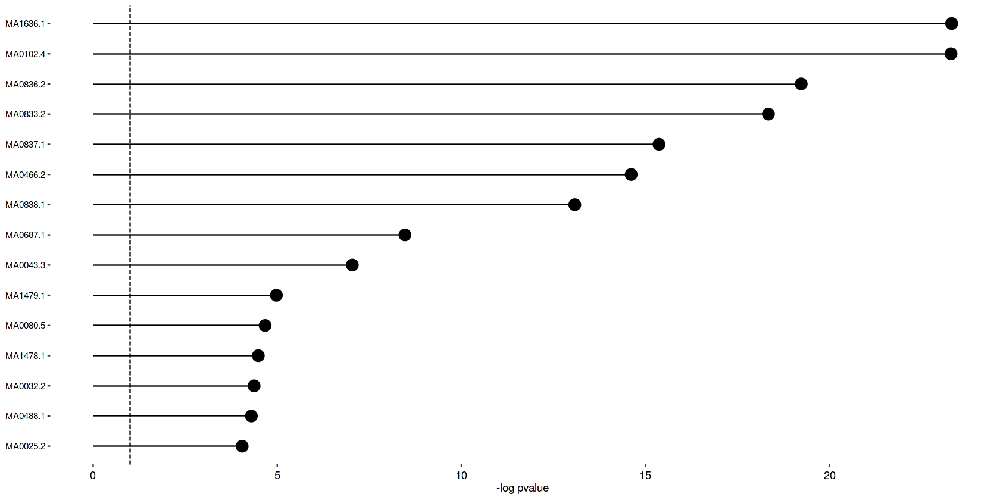

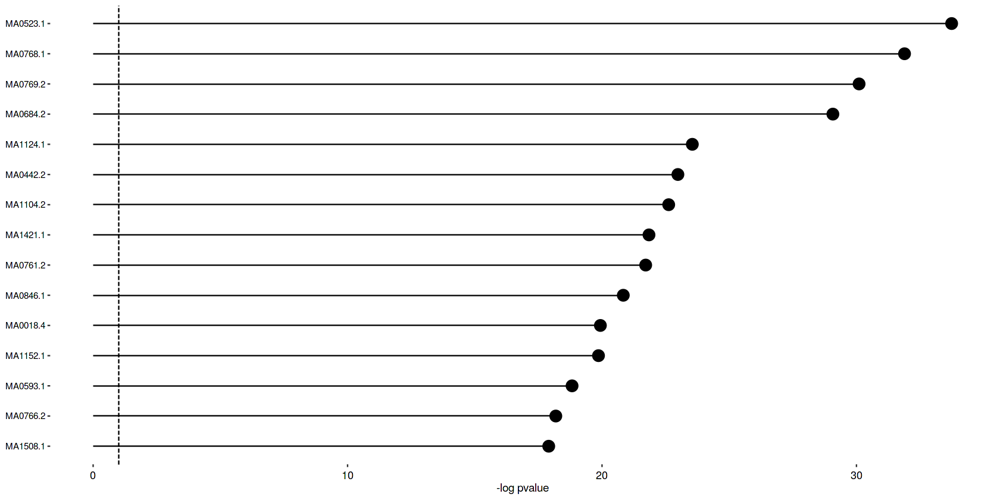

In [53]:
plot_enrichment(motif.enrichment.positive, factor = 1, max.pathways = 15)
plot_enrichment(motif.enrichment.negative, factor = 1, max.pathways = 15)

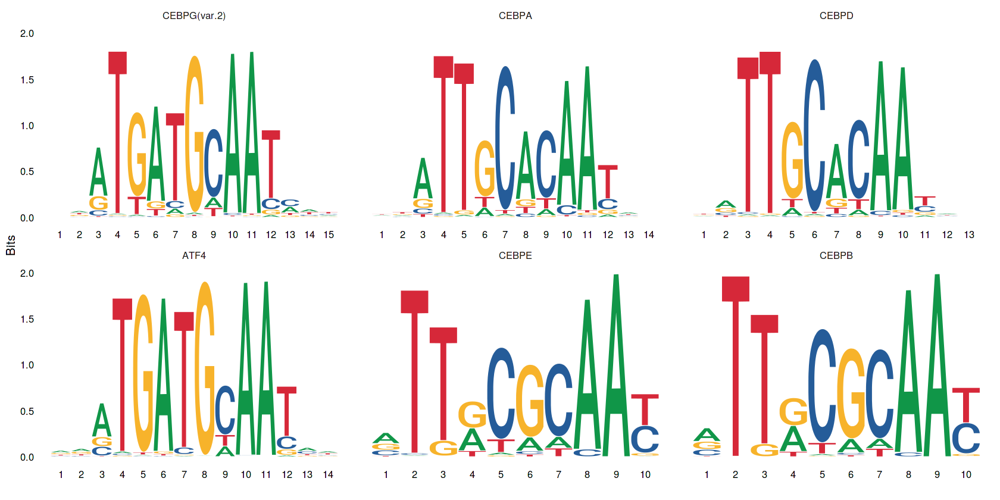

In [54]:
sig.motifs.positive <- motif.enrichment.positive$pval.adj[,"Factor1"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(sortedSeurat[["ATAC_distal"]], motifs = sig.motifs.positive)

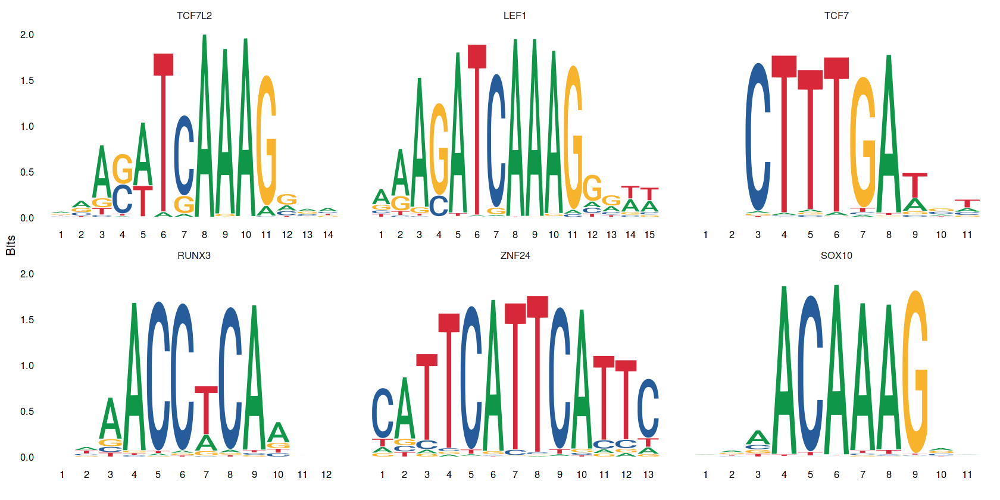

In [55]:
sig.motifs.negative <- motif.enrichment.negative$pval.adj[,"Factor1"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(sortedSeurat[["ATAC_distal"]], motifs = sig.motifs.negative)

In [57]:
seurat <- RunChromVAR(
  object = sortedSeurat, 
  assay = "ATAC_distal",
  genome = BSgenome.Hsapiens.UCSC.hg38, 
  new.assay.name = "chromvar"
)

DefaultAssay(sortedSeurat) <- "chromvar"

ERROR: Error in RunChromVAR.Seurat(object = sortedSeurat, assay = "ATAC_distal", : Please install chromVAR. https://greenleaflab.github.io/chromVAR/


In [58]:
motifs.to.plot <- c(sig.motifs.positive[1:2], sig.motifs.negative[1:2])

FeaturePlot(sortedSeurat,
  features = motifs.to.plot,
  reduction = "umap",
  combine = TRUE
) & NoLegend() & NoAxes()

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: MA1636.1, MA0102.4, MA0523.1, MA0768.1"


ERROR: Error: None of the requested features were found: MA1636.1, MA0102.4, MA0523.1, MA0768.1 in slot data


In [53]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Debian GNU/Linux bullseye/sid

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/openblas-pthread/libblas.so.3
LAPACK: /usr/lib/x86_64-linux-gnu/openblas-pthread/libopenblasp-r0.3.10.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] psych_2.0.9         magrittr_1.5        ggbio_1.38.0       
 [4] BiocGenerics_0.36.0 msigdbr_7.2.1       ggpubr_0.4.0       
 [7] Signac_1.0.0        Seurat_3.2.2        reticulate_1.16    
[10] purrr_0.3.4         